# 🌿 Bài 2 – Nhận diện Bệnh Lá Cây bằng Deep Learning
## (Plant Leaf Disease Classification with Transfer Learning)

**Sinh viên:** [Tên sinh viên]  
**Môn học:** Deep Learning  

---

## 📌 1. Đặt vấn đề (Problem Statement)

Nông nghiệp Việt Nam đóng góp hơn 12% GDP quốc gia. Bệnh trên lá cây là nguyên nhân hàng đầu gây mất mùa,  
nhưng việc chẩn đoán thủ công đòi hỏi chuyên gia, tốn thời gian và chi phí cao.

**Bài toán:** Xây dựng mô hình Deep Learning có khả năng **phân loại 38 loại bệnh / trạng thái khỏe mạnh**  
trên 14 loài cây trồng phổ biến chỉ từ một ảnh chụp lá cây.

**Input:** Ảnh RGB của lá cây (chụp từ điện thoại / camera)  
**Output:** Tên bệnh (ví dụ: "Tomato – Late blight", "Apple – Black rot", "Healthy")

---

## 🎯 2. Tại sao chọn bài toán này?

| Lý do | Chi tiết |
|---|---|
| 🌾 Tính thực tiễn cao | Việt Nam là nước nông nghiệp, áp dụng ngay vào thực tế |
| 📦 Dataset công khai | PlantVillage: 54.000+ ảnh, 38 nhãn, miễn phí trên Kaggle |
| 🔬 Kỹ thuật tiên tiến | Transfer Learning với EfficientNetB0 – state-of-the-art cho ảnh |
| 📱 Khả năng triển khai | Model nhẹ, có thể đưa vào app mobile cho nông dân |
| 📈 Kết quả đo được | Accuracy, F1-score, Confusion Matrix rõ ràng |

---

## 🧠 3. Giải pháp đề xuất

**Transfer Learning với EfficientNetB0:**
- EfficientNetB0 được pre-train trên ImageNet (1.2M ảnh, 1000 lớp)
- Freeze backbone → train classification head trên PlantVillage
- Sau đó Fine-tune toàn bộ mạng với learning rate thấp hơn
- Data Augmentation để tăng tính tổng quát hóa

**Lý do chọn EfficientNetB0 thay vì VGG/ResNet:**
- Accuracy cao hơn với số tham số ít hơn (5.3M params)
- Compound scaling: cân bằng depth/width/resolution
- Phù hợp deploy lên thiết bị hạn chế tài nguyên


## ☁️ [LOAD] Khôi phục từ Google Drive (chạy cell này nếu đã train trước đó)

> **Bỏ qua cell này nếu bạn đang train lần đầu.**  
> Chạy cell này khi Colab bị reset và bạn muốn tiếp tục từ checkpoint đã lưu.


In [2]:
# ============================================================
#  LOAD TẤT CẢ TỪ GOOGLE DRIVE
#  Chạy cell này thay cho toàn bộ phần Download + Train
# ============================================================
import os, shutil, json
from google.colab import drive

drive.mount('/content/drive')

DRIVE_DIR = '/content/drive/MyDrive/PlantDisease_Checkpoint'

if not os.path.exists(DRIVE_DIR):
    print("Chưa có checkpoint trên Drive. Hãy chạy notebook từ đầu để train.")
else:
    print(f"Drive checkpoint folder: {DRIVE_DIR}")
    print(os.listdir(DRIVE_DIR))

    # ── 1. Load class names ──────────────────────────────────────
    class_names_path = f'{DRIVE_DIR}/class_names.json'
    with open(class_names_path, 'r') as f:
        class_names = json.load(f)
    NUM_CLASSES = len(class_names)
    print(f"\nclass_names.json loaded  → {NUM_CLASSES} lớp")

    # ── 2. Giải nén split dataset ────────────────────────────────
    zip_path = f'{DRIVE_DIR}/split_data.zip'
    if os.path.exists(zip_path) and not os.path.exists('/content/split/train'):
        print("  Đang giải nén split_data.zip ...")
        shutil.unpack_archive(zip_path, '/content/split')
        print("split_data.zip extracted → /content/split")
    elif os.path.exists('/content/split/train'):
        print("/content/split đã tồn tại, bỏ qua giải nén")
    else:
        print("Không tìm thấy split_data.zip trên Drive")

    # ── 3. Load model ────────────────────────────────────────────
    import tensorflow as tf

    IMG_SIZE = 224

    #  ĐÃ SỬA: Bỏ hàm build_model() đi, load trực tiếp toàn bộ model đã lưu
    print("Đang load model từ Drive, vui lòng đợi vài giây...")
    model = tf.keras.models.load_model(f'{DRIVE_DIR}/best_model.keras')

    print(f"best_model.keras loaded thành công → {model.count_params():,} params")

    # ── 4. Tạo lại test generator để evaluate/demo ───────────────
    from tensorflow.keras.preprocessing.image import ImageDataGenerator

    BATCH_SIZE   = 32
    test_dir     = '/content/split/test'
    val_test_gen = ImageDataGenerator()

    test_gen = val_test_gen.flow_from_directory(
        test_dir,
        target_size=(IMG_SIZE, IMG_SIZE),
        batch_size=BATCH_SIZE,
        class_mode='categorical',
        shuffle=False
    )

    print(f"test_gen ready  → {test_gen.samples:,} ảnh test")
    print("\nKhôi phục hoàn tất! Bạn có thể chạy thẳng phần Evaluate / Demo.")


Mounted at /content/drive
Drive checkpoint folder: /content/drive/MyDrive/PlantDisease_Checkpoint
['checkpoint_phase1.keras', 'best_model.keras', 'split_data.zip', 'class_names.json', 'eda_distribution.png', 'training_curves.png', 'demo_results.png', 'confusion_matrix.png', 'augmentation.png', 'gradcam.png', 'eda_samples.png']

class_names.json loaded  → 38 lớp
  Đang giải nén split_data.zip ...
split_data.zip extracted → /content/split
Đang load model từ Drive, vui lòng đợi vài giây...
best_model.keras loaded thành công → 4,392,393 params
Found 8179 images belonging to 38 classes.
test_gen ready  → 8,179 ảnh test

Khôi phục hoàn tất! Bạn có thể chạy thẳng phần Evaluate / Demo.


## ⚙️ 4. Cài đặt môi trường

In [ ]:
# Kiểm tra GPU
import subprocess
result = subprocess.run(['nvidia-smi'], capture_output=True, text=True)
print(result.stdout if result.returncode == 0 else "No GPU found – using CPU")


Wed Apr 29 09:50:59 2026       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 580.82.07              Driver Version: 580.82.07      CUDA Version: 13.0     |
+-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla T4                       Off |   00000000:00:04.0 Off |                    0 |
| N/A   48C    P8             11W /   70W |       0MiB /  15360MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

In [ ]:
# Cài đặt thư viện cần thiết
!pip install -q kaggle tensorflow matplotlib seaborn scikit-learn Pillow tqdm
print("Đã cài đặt xong!")


Đã cài đặt xong!


## 📥 5. Tải Dataset

**PlantVillage Dataset**  
- Nguồn: [Kaggle – abdallahalidev/plantvillage-dataset](https://www.kaggle.com/datasets/abdallahalidev/plantvillage-dataset)  
- 54.306 ảnh, 38 nhãn, 14 loài cây  
- License: CC BY 4.0  

> **Cách lấy Kaggle API key:**  
> Vào kaggle.com → Account → Create New Token → tải `kaggle.json`  
> Upload file đó lên Colab khi được hỏi.


In [ ]:
import os, json
from google.colab import files

# Upload kaggle.json
if not os.path.exists('/root/.kaggle/kaggle.json'):
    print("Vui lòng upload file kaggle.json của bạn:")
    uploaded = files.upload()
    os.makedirs('/root/.kaggle', exist_ok=True)
    with open('/root/.kaggle/kaggle.json', 'wb') as f:
        f.write(list(uploaded.values())[0])
    os.chmod('/root/.kaggle/kaggle.json', 0o600)
    print("Đã lưu kaggle.json")
else:
    print("kaggle.json đã tồn tại")


Vui lòng upload file kaggle.json của bạn:


Saving kaggle.json to kaggle.json
Đã lưu kaggle.json


In [ ]:
# Tải dataset từ Kaggle
!kaggle datasets download -d abdallahalidev/plantvillage-dataset -p /content/data --unzip -q
print("Dataset đã được tải về!")

# Kiểm tra cấu trúc thư mục
import os
base_dir = '/content/data/plantvillage dataset/color'
classes = sorted(os.listdir(base_dir))
print(f"\nTổng số lớp: {len(classes)}")
print("\nDanh sách các lớp:")
for i, c in enumerate(classes):
    n = len(os.listdir(os.path.join(base_dir, c)))
    print(f"  {i+1:2d}. {c:<50s} ({n:>4d} ảnh)")


Dataset URL: https://www.kaggle.com/datasets/abdallahalidev/plantvillage-dataset
License(s): CC-BY-NC-SA-4.0
Dataset đã được tải về!

Tổng số lớp: 38

Danh sách các lớp:
   1. Apple___Apple_scab                                 ( 630 ảnh)
   2. Apple___Black_rot                                  ( 621 ảnh)
   3. Apple___Cedar_apple_rust                           ( 275 ảnh)
   4. Apple___healthy                                    (1645 ảnh)
   5. Blueberry___healthy                                (1502 ảnh)
   6. Cherry_(including_sour)___Powdery_mildew           (1052 ảnh)
   7. Cherry_(including_sour)___healthy                  ( 854 ảnh)
   8. Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot ( 513 ảnh)
   9. Corn_(maize)___Common_rust_                        (1192 ảnh)
  10. Corn_(maize)___Northern_Leaf_Blight                ( 985 ảnh)
  11. Corn_(maize)___healthy                             (1162 ảnh)
  12. Grape___Black_rot                                  (1180 ảnh)
  13. Grape___

## 🔍 6. Khám phá dữ liệu (EDA)

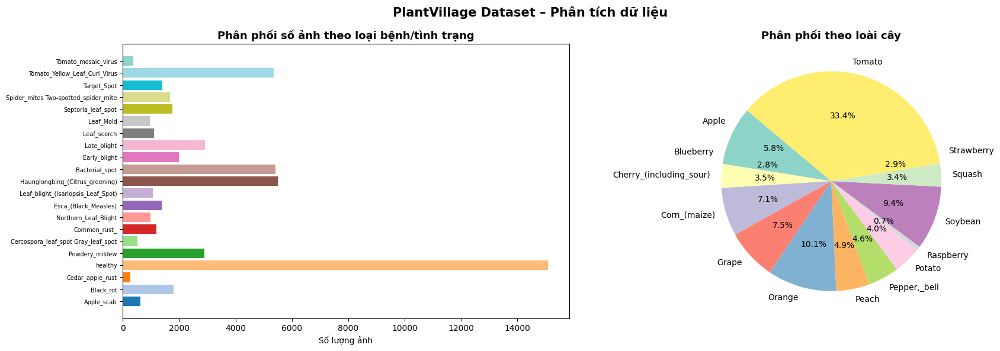

Tổng số ảnh: 54,305


In [ ]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import numpy as np
import os, random

base_dir = '/content/data/plantvillage dataset/color'
classes = sorted(os.listdir(base_dir))

# Thống kê số ảnh mỗi lớp gốc
class_counts = {}
for c in classes:
    class_counts[c] = len(os.listdir(os.path.join(base_dir, c)))

# Khởi tạo không gian vẽ biểu đồ
fig, axes = plt.subplots(1, 2, figsize=(18, 6))

# ---------------------------------------------------------
# Biểu đồ 1 (Bar chart): Phân phối theo loại bệnh/tình trạng
# ---------------------------------------------------------
disease_counts = {}
for c in classes:
    # Lấy phần tên bệnh/tình trạng (sau dấu '___')
    disease = c.split('___')[1] if '___' in c else c
    # Gom nhóm và cộng dồn số lượng ảnh
    disease_counts[disease] = disease_counts.get(disease, 0) + class_counts[c]

# Trích xuất dữ liệu để vẽ
diseases = list(disease_counts.keys())
d_counts = list(disease_counts.values())

# Tạo dải màu tương ứng với số lượng nhóm bệnh
colors = plt.cm.tab20.colors + plt.cm.Set3.colors
colors = colors[:len(diseases)]
# Vẽ Bar chart
axes[0].barh(diseases, d_counts, color=colors)
axes[0].set_xlabel('Số lượng ảnh')
axes[0].set_title('Phân phối số ảnh theo loại bệnh/tình trạng', fontsize=13, fontweight='bold')
axes[0].tick_params(axis='y', labelsize=7)

# ---------------------------------------------------------
# Biểu đồ 2 (Pie chart): Phân phối theo loài cây
# ---------------------------------------------------------
plant_counts = {}
for c in classes:
    # Lấy phần tên loài cây (trước dấu '___')
    plant = c.split('___')[0] if '___' in c else c
    # Gom nhóm và cộng dồn số lượng ảnh
    plant_counts[plant] = plant_counts.get(plant, 0) + class_counts[c]

# Vẽ Pie chart
axes[1].pie(plant_counts.values(), labels=plant_counts.keys(),
            autopct='%1.1f%%', startangle=140,
            colors=plt.cm.Set3(np.linspace(0, 1, len(plant_counts))))
axes[1].set_title('Phân phối theo loài cây', fontsize=13, fontweight='bold')

# ---------------------------------------------------------
# Thiết lập tổng thể và hiển thị
# ---------------------------------------------------------
plt.suptitle('PlantVillage Dataset – Phân tích dữ liệu', fontsize=15, fontweight='bold')
plt.tight_layout()
plt.savefig('eda_distribution.png', dpi=150, bbox_inches='tight')
plt.show()

# Tính tổng số ảnh từ danh sách gốc
print(f"Tổng số ảnh: {sum(class_counts.values()):,}")

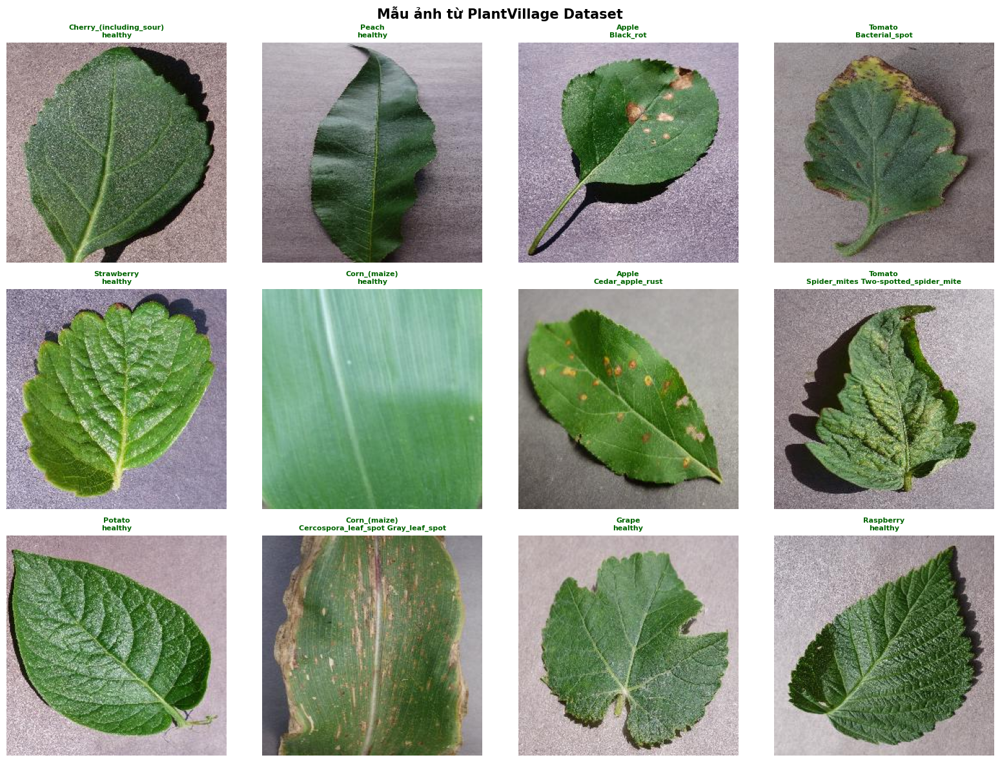

In [ ]:
# Hiển thị mẫu ảnh từ một số lớp
sample_classes = random.sample(classes, min(12, len(classes)))

fig, axes = plt.subplots(3, 4, figsize=(16, 12))
axes = axes.flatten()

for ax, cls in zip(axes, sample_classes):
    cls_dir = os.path.join(base_dir, cls)
    img_file = random.choice(os.listdir(cls_dir))
    img = mpimg.imread(os.path.join(cls_dir, img_file))
    ax.imshow(img)
    # Rút gọn tên hiển thị
    plant, disease = (cls.split('___') + [''])[:2]
    ax.set_title(f"{plant}\n{disease}", fontsize=8, fontweight='bold', color='darkgreen')
    ax.axis('off')

plt.suptitle('Mẫu ảnh từ PlantVillage Dataset', fontsize=15, fontweight='bold')
plt.tight_layout()
plt.savefig('eda_samples.png', dpi=150, bbox_inches='tight')
plt.show()


## 🔧 7. Tiền xử lý dữ liệu (Preprocessing & Augmentation)

In [ ]:
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.model_selection import train_test_split
import shutil, pathlib

# Cấu hình
IMG_SIZE   = 224      # EfficientNetB0 expects 224x224
BATCH_SIZE = 32
SEED       = 42

base_dir = '/content/data/plantvillage dataset/color'
classes  = sorted(os.listdir(base_dir))
NUM_CLASSES = len(classes)
print(f"Số lớp: {NUM_CLASSES}")

# Chia train/val/test: 70/15/15
train_dir = '/content/split/train'
val_dir   = '/content/split/val'
test_dir  = '/content/split/test'

for split_d in [train_dir, val_dir, test_dir]:
    os.makedirs(split_d, exist_ok=True)

print("Đang chia dữ liệu train/val/test...")
for cls in classes:
    cls_src = os.path.join(base_dir, cls)
    imgs = os.listdir(cls_src)
    random.seed(SEED)
    random.shuffle(imgs)

    n = len(imgs)
    n_train = int(0.70 * n)
    n_val   = int(0.15 * n)

    splits = {
        train_dir: imgs[:n_train],
        val_dir:   imgs[n_train:n_train+n_val],
        test_dir:  imgs[n_train+n_val:]
    }
    for dest_base, file_list in splits.items():
        dest = os.path.join(dest_base, cls)
        os.makedirs(dest, exist_ok=True)
        for f in file_list:
            src_path = os.path.join(cls_src, f)
            dst_path = os.path.join(dest, f)
            if not os.path.exists(dst_path):
                shutil.copy2(src_path, dst_path)

# Đếm
n_train = sum(len(os.listdir(os.path.join(train_dir, c))) for c in os.listdir(train_dir))
n_val   = sum(len(os.listdir(os.path.join(val_dir,   c))) for c in os.listdir(val_dir))
n_test  = sum(len(os.listdir(os.path.join(test_dir,  c))) for c in os.listdir(test_dir))
print(f"Train: {n_train:,} | Val: {n_val:,} | Test: {n_test:,}")


Số lớp: 38
Đang chia dữ liệu train/val/test...
Train: 37,997 | Val: 8,129 | Test: 8,179


Found 37997 images belonging to 38 classes.
Found 8129 images belonging to 38 classes.
Found 8179 images belonging to 38 classes.
Đã tạo data generators
Classes: 38


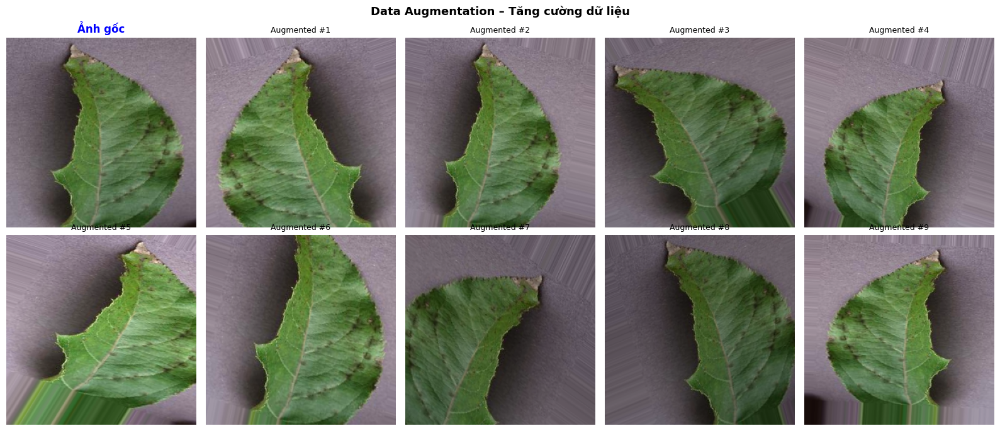

In [ ]:
# Data Augmentation
train_datagen = ImageDataGenerator(
    rotation_range=30,
    width_shift_range=0.15,
    height_shift_range=0.15,
    shear_range=0.15,
    zoom_range=0.2,
    horizontal_flip=True,
    brightness_range=[0.7, 1.3],
    fill_mode='nearest'
)

val_test_datagen = ImageDataGenerator()

train_gen = train_datagen.flow_from_directory(
    train_dir,
    target_size=(IMG_SIZE, IMG_SIZE),
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    shuffle=True,
    seed=SEED
)

val_gen = val_test_datagen.flow_from_directory(
    val_dir,
    target_size=(IMG_SIZE, IMG_SIZE),
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    shuffle=False
)

test_gen = val_test_datagen.flow_from_directory(
    test_dir,
    target_size=(IMG_SIZE, IMG_SIZE),
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    shuffle=False
)

class_names = list(train_gen.class_indices.keys())
print("Đã tạo data generators")
print(f"Classes: {train_gen.num_classes}")

# Minh họa augmentation
fig, axes = plt.subplots(2, 5, figsize=(16, 7))
sample_cls = classes[0]
sample_img_path = os.path.join(base_dir, sample_cls,
                               os.listdir(os.path.join(base_dir, sample_cls))[0])
sample_img = mpimg.imread(sample_img_path)
original = tf.image.resize(sample_img, [IMG_SIZE, IMG_SIZE]).numpy() / 255.

axes[0, 0].imshow(original)
axes[0, 0].set_title('Ảnh gốc', fontweight='bold', color='blue')
axes[0, 0].axis('off')

aug_gen = train_datagen.flow(
    np.expand_dims(sample_img, 0), batch_size=1
)
for i, ax in enumerate(axes.flatten()[1:]):
    aug_img = next(aug_gen)[0]
    ax.imshow(aug_img / 255.0)
    ax.set_title(f'Augmented #{i+1}', fontsize=9)
    ax.axis('off')

plt.suptitle('Data Augmentation – Tăng cường dữ liệu', fontsize=13, fontweight='bold')
plt.tight_layout()
plt.savefig('augmentation.png', dpi=150, bbox_inches='tight')
plt.show()


## 🧠 8. Xây dựng Mô hình (Model Architecture)

### Lý do chọn EfficientNetB0

| Model | Top-1 Acc (ImageNet) | Params | FLOPs |
|---|---|---|---|
| VGG16 | 71.3% | 138M | 15.5B |
| ResNet50 | 74.9% | 25M | 4.1B |
| **EfficientNetB0** | **77.1%** | **5.3M** | **0.39B** |
| EfficientNetB7 | 84.4% | 66M | 37B |

EfficientNetB0 cho accuracy cao nhất với chi phí tính toán thấp nhất — lý tưởng để fine-tune.

### Kiến trúc Transfer Learning
```
ImageNet Pretrained EfficientNetB0
    ↓
GlobalAveragePooling2D
    ↓
BatchNormalization
    ↓
Dense(256, relu) + Dropout(0.4)
    ↓
Dense(38, softmax)  ← 38 bệnh/trạng thái
```


In [ ]:
from tensorflow.keras import layers, Model
from tensorflow.keras.applications import EfficientNetB0
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import (EarlyStopping, ReduceLROnPlateau,
                                         ModelCheckpoint, TensorBoard)

def build_model(num_classes, img_size=224, trainable_backbone=False):
    """
    Transfer Learning với EfficientNetB0.
    trainable_backbone=False: Phase 1 – chỉ train head
    trainable_backbone=True:  Phase 2 – fine-tune toàn bộ
    """
    base_model = EfficientNetB0(
        include_top=False,
        weights='imagenet',
        input_shape=(img_size, img_size, 3)
    )
    base_model.trainable = trainable_backbone

    inputs = tf.keras.Input(shape=(img_size, img_size, 3))
    x = base_model(inputs, training=False)
    x = layers.GlobalAveragePooling2D()(x)
    x = layers.BatchNormalization()(x)
    x = layers.Dense(256, activation='relu')(x)
    x = layers.Dropout(0.4)(x)
    outputs = layers.Dense(num_classes, activation='softmax')(x)

    model = Model(inputs, outputs)
    return model, base_model

# Phase 1: Freeze backbone
model, base_model = build_model(NUM_CLASSES, IMG_SIZE, trainable_backbone=False)

model.compile(
    optimizer=Adam(learning_rate=1e-3),
    loss='categorical_crossentropy',
    metrics=['accuracy', tf.keras.metrics.TopKCategoricalAccuracy(k=5, name='top5_acc')]
)

model.summary()
print(f"\nTrainable params: {model.count_params():,}")


16705208/16705208 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_1 (InputLayer)      │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ efficientnetb0 (Functional)     │ (None, 7, 7, 1280)     │     4,049,571 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d        │ (None, 1280)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 1280)           │         5,120 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 256)            │       327,936 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 38)             │         9,766 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 4,392,393 (16.76 MB)

 Trainable params: 340,262 (1.30 MB)

 Non-trainable params: 4,052,131 (15.46 MB)


Trainable params: 4,392,393


## 🏋️ 9. Huấn luyện – Phase 1: Train Classification Head

In [ ]:
import datetime

EPOCHS_PHASE1 = 15

callbacks_p1 = [
    EarlyStopping(monitor='val_accuracy', patience=5, restore_best_weights=True, verbose=1),
    ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=3, min_lr=1e-7, verbose=1),
    ModelCheckpoint(
        '/content/checkpoint_phase1.keras',
        monitor='val_accuracy', save_best_only=True, verbose=1
    ),
]

print("Bắt đầu Phase 1 – Chỉ train classification head...")
history1 = model.fit(
    train_gen,
    epochs=EPOCHS_PHASE1,
    validation_data=val_gen,
    callbacks=callbacks_p1,
    verbose=1
)
print("Phase 1 hoàn thành!")


Bắt đầu Phase 1 – Chỉ train classification head...
Epoch 1/15
1188/1188 ━━━━━━━━━━━━━━━━━━━━ 0s 499ms/step - accuracy: 0.7577 - loss: 0.8861 - top5_acc: 0.9220
Epoch 1: val_accuracy improved from None to 0.93406, saving model to /content/checkpoint_phase1.keras

Epoch 1: finished saving model to /content/checkpoint_phase1.keras
1188/1188 ━━━━━━━━━━━━━━━━━━━━ 665s 527ms/step - accuracy: 0.8413 - loss: 0.5360 - top5_acc: 0.9719 - val_accuracy: 0.9341 - val_loss: 0.2100 - val_top5_acc: 0.9967 - learning_rate: 0.0010
Epoch 2/15
1188/1188 ━━━━━━━━━━━━━━━━━━━━ 0s 459ms/step - accuracy: 0.9091 - loss: 0.2847 - top5_acc: 0.9945
Epoch 2: val_accuracy improved from 0.93406 to 0.95055, saving model to /content/checkpoint_phase1.keras

Epoch 2: finished saving model to /content/checkpoint_phase1.keras
1188/1188 ━━━━━━━━━━━━━━━━━━━━ 560s 471ms/step - accuracy: 0.9097 - loss: 0.2825 - top5_acc: 0.9952 - val_accuracy: 0.9505 - val_loss: 0.1532 - val_top5_acc: 0.9986 - learning_rate: 0.0010
Epoch 3/15

## 🔥 10. Huấn luyện – Phase 2: Fine-tuning Toàn bộ Mạng

In [ ]:
# Unfreeze toàn bộ backbone, dùng LR nhỏ hơn để không phá vỡ learned features
base_model.trainable = True

# Chỉ fine-tune 40 layers cuối để tiết kiệm thời gian
for layer in base_model.layers[:-40]:
    layer.trainable = False

print(f"Số layer trainable: {sum(1 for l in model.layers if l.trainable)}/{len(model.layers)}")

model.compile(
    optimizer=Adam(learning_rate=1e-4),   # LR nhỏ hơn 10x
    loss='categorical_crossentropy',
    metrics=['accuracy', tf.keras.metrics.TopKCategoricalAccuracy(k=5, name='top5_acc')]
)

EPOCHS_PHASE2 = 20

callbacks_p2 = [
    EarlyStopping(monitor='val_accuracy', patience=6, restore_best_weights=True, verbose=1),
    ReduceLROnPlateau(monitor='val_loss', factor=0.3, patience=3, min_lr=1e-8, verbose=1),
    ModelCheckpoint(
        '/content/best_model.keras',
        monitor='val_accuracy', save_best_only=True, verbose=1
    ),
]

print("Bắt đầu Phase 2 – Fine-tuning...")
history2 = model.fit(
    train_gen,
    epochs=EPOCHS_PHASE2,
    validation_data=val_gen,
    callbacks=callbacks_p2,
    initial_epoch=len(history1.history['accuracy']),
    verbose=1
)
print("Phase 2 hoàn thành!")


Số layer trainable: 7/7
Bắt đầu Phase 2 – Fine-tuning...
Epoch 11/20
1188/1188 ━━━━━━━━━━━━━━━━━━━━ 0s 476ms/step - accuracy: 0.9097 - loss: 0.2797 - top5_acc: 0.9947
Epoch 11: val_accuracy improved from None to 0.97281, saving model to /content/best_model.keras

Epoch 11: finished saving model to /content/best_model.keras
1188/1188 ━━━━━━━━━━━━━━━━━━━━ 628s 500ms/step - accuracy: 0.9325 - loss: 0.2073 - top5_acc: 0.9969 - val_accuracy: 0.9728 - val_loss: 0.0858 - val_top5_acc: 0.9998 - learning_rate: 1.0000e-04
Epoch 12/20
1188/1188 ━━━━━━━━━━━━━━━━━━━━ 0s 462ms/step - accuracy: 0.9591 - loss: 0.1251 - top5_acc: 0.9988
Epoch 12: val_accuracy improved from 0.97281 to 0.97786, saving model to /content/best_model.keras

Epoch 12: finished saving model to /content/best_model.keras
1188/1188 ━━━━━━━━━━━━━━━━━━━━ 563s 474ms/step - accuracy: 0.9609 - loss: 0.1195 - top5_acc: 0.9991 - val_accuracy: 0.9779 - val_loss: 0.0659 - val_top5_acc: 0.9998 - learning_rate: 1.0000e-04
Epoch 13/20
1188/1

## 📈 11. Biểu đồ Quá trình Huấn luyện

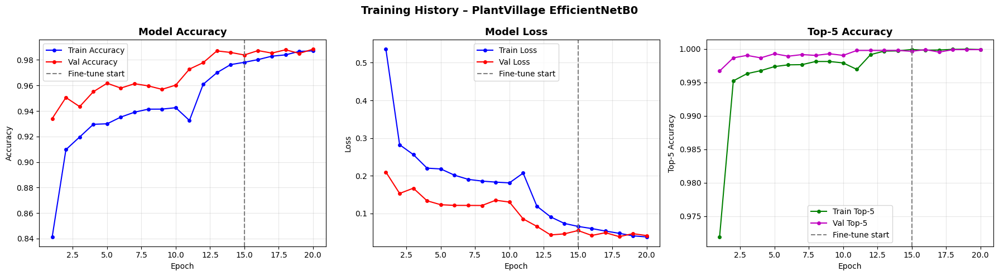

In [ ]:
def merge_histories(h1, h2):
    merged = {}
    for key in h1.history:
        merged[key] = h1.history[key] + h2.history[key]
    return merged

history = merge_histories(history1, history2)
epochs_range = range(1, len(history['accuracy']) + 1)

fig, axes = plt.subplots(1, 3, figsize=(18, 5))

# Accuracy
axes[0].plot(epochs_range, history['accuracy'],     'b-o', markersize=4, label='Train Accuracy')
axes[0].plot(epochs_range, history['val_accuracy'], 'r-o', markersize=4, label='Val Accuracy')
axes[0].axvline(x=EPOCHS_PHASE1, color='gray', linestyle='--', label='Fine-tune start')
axes[0].set_title('Model Accuracy', fontsize=13, fontweight='bold')
axes[0].set_xlabel('Epoch'); axes[0].set_ylabel('Accuracy')
axes[0].legend(); axes[0].grid(alpha=0.3)

# Loss
axes[1].plot(epochs_range, history['loss'],     'b-o', markersize=4, label='Train Loss')
axes[1].plot(epochs_range, history['val_loss'], 'r-o', markersize=4, label='Val Loss')
axes[1].axvline(x=EPOCHS_PHASE1, color='gray', linestyle='--', label='Fine-tune start')
axes[1].set_title('Model Loss', fontsize=13, fontweight='bold')
axes[1].set_xlabel('Epoch'); axes[1].set_ylabel('Loss')
axes[1].legend(); axes[1].grid(alpha=0.3)

# Top-5 Accuracy
axes[2].plot(epochs_range, history['top5_acc'],     'g-o', markersize=4, label='Train Top-5')
axes[2].plot(epochs_range, history['val_top5_acc'], 'm-o', markersize=4, label='Val Top-5')
axes[2].axvline(x=EPOCHS_PHASE1, color='gray', linestyle='--', label='Fine-tune start')
axes[2].set_title('Top-5 Accuracy', fontsize=13, fontweight='bold')
axes[2].set_xlabel('Epoch'); axes[2].set_ylabel('Top-5 Accuracy')
axes[2].legend(); axes[2].grid(alpha=0.3)

plt.suptitle('Training History – PlantVillage EfficientNetB0', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.savefig('training_curves.png', dpi=150, bbox_inches='tight')
plt.show()


## 📊 12. Đánh giá mô hình trên Test Set

In [ ]:
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns

# Load best checkpoint
model.load_weights('/content/best_model.keras')

# Đánh giá trên test set
print("Đánh giá trên Test Set...")
test_loss, test_acc, test_top5 = model.evaluate(test_gen, verbose=1)
print(f"\n{'='*40}")
print(f"  Test Accuracy   : {test_acc:.4f} ({test_acc*100:.2f}%)")
print(f"  Test Top-5 Acc  : {test_top5:.4f} ({test_top5*100:.2f}%)")
print(f"  Test Loss       : {test_loss:.4f}")
print(f"{'='*40}")


Đánh giá trên Test Set...
256/256 ━━━━━━━━━━━━━━━━━━━━ 25s 97ms/step - accuracy: 0.9884 - loss: 0.0373 - top5_acc: 1.0000

  Test Accuracy   : 0.9884 (98.84%)
  Test Top-5 Acc  : 1.0000 (100.00%)
  Test Loss       : 0.0373


In [ ]:
import numpy as np
# Predictions
print("Đang tạo predictions...")
y_pred_proba = model.predict(test_gen, verbose=1)
y_pred = np.argmax(y_pred_proba, axis=1)
y_true = test_gen.classes

# Classification Report
short_names = [c.split('___')[1][:20] if '___' in c else c[:20]
               for c in class_names]
report = classification_report(y_true, y_pred, target_names=short_names, digits=3)
print("\n Classification Report:")
print(report)


Đang tạo predictions...
256/256 ━━━━━━━━━━━━━━━━━━━━ 27s 78ms/step

 Classification Report:
                      precision    recall  f1-score   support

          Apple_scab      0.989     0.989     0.989        95
           Black_rot      0.979     1.000     0.989        94
    Cedar_apple_rust      1.000     1.000     1.000        42
             healthy      1.000     0.980     0.990       248
             healthy      1.000     0.996     0.998       226
      Powdery_mildew      1.000     0.987     0.994       159
             healthy      1.000     0.992     0.996       129
Cercospora_leaf_spot      0.869     0.936     0.901        78
        Common_rust_      1.000     0.994     0.997       180
Northern_Leaf_Blight      0.958     0.926     0.942       149
             healthy      1.000     1.000     1.000       175
           Black_rot      0.983     1.000     0.992       177
Esca_(Black_Measles)      1.000     0.986     0.993       208
Leaf_blight_(Isariop      1.000     1.0

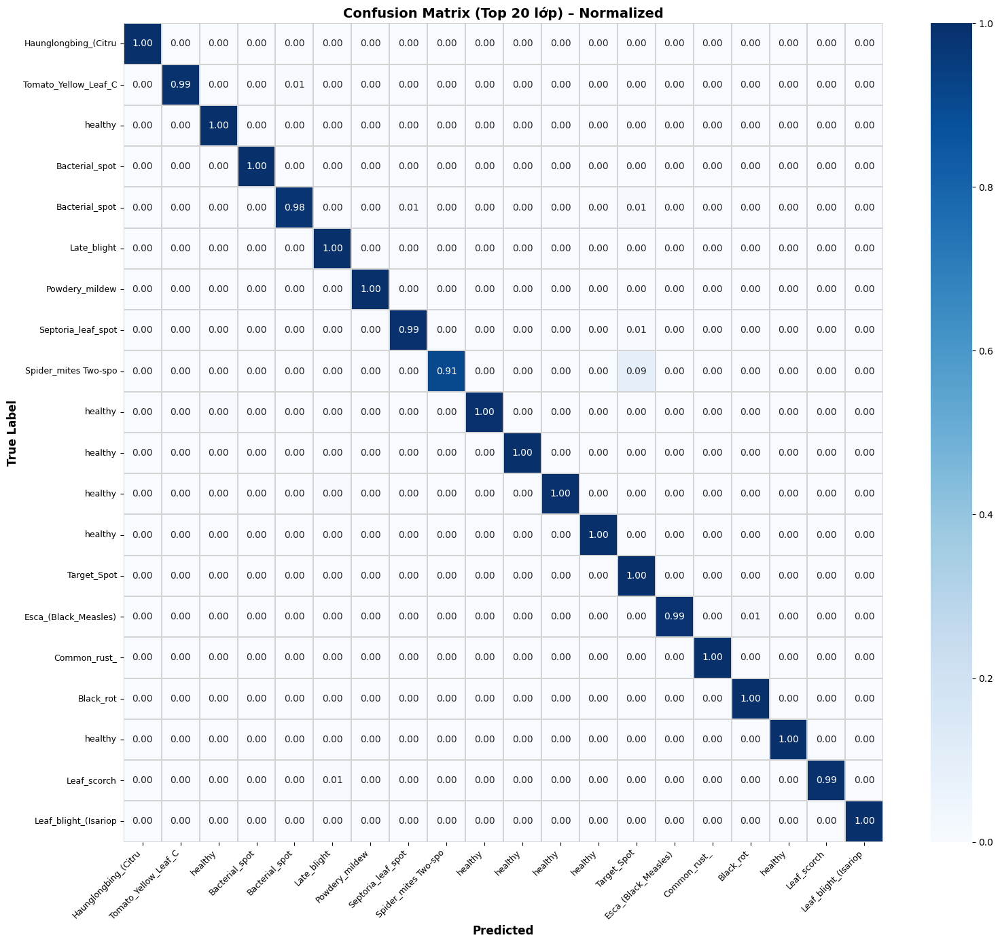

In [ ]:
# Confusion Matrix (Top 20 classes cho dễ nhìn)
from collections import Counter

# Lấy 20 lớp nhiều ảnh nhất
top20_idx = sorted(Counter(y_true).keys(),
                   key=lambda x: Counter(y_true)[x], reverse=True)[:20]
top20_names = [short_names[i] for i in top20_idx]

mask_true = np.isin(y_true, top20_idx)
y_true_20 = y_true[mask_true]
y_pred_20 = y_pred[mask_true]

# Re-map to 0..19
remap = {old: new for new, old in enumerate(top20_idx)}
y_true_20 = np.array([remap[v] for v in y_true_20])
y_pred_20 = np.array([remap.get(v, -1) for v in y_pred_20])
valid = y_pred_20 >= 0
y_true_20, y_pred_20 = y_true_20[valid], y_pred_20[valid]

cm = confusion_matrix(y_true_20, y_pred_20)
cm_norm = cm.astype(float) / cm.sum(axis=1, keepdims=True)

fig, ax = plt.subplots(figsize=(16, 14))
sns.heatmap(cm_norm, annot=True, fmt='.2f', cmap='Blues',
            xticklabels=top20_names, yticklabels=top20_names, ax=ax,
            linewidths=0.3, linecolor='lightgray')
ax.set_xlabel('Predicted', fontsize=12, fontweight='bold')
ax.set_ylabel('True Label', fontsize=12, fontweight='bold')
ax.set_title('Confusion Matrix (Top 20 lớp) – Normalized', fontsize=14, fontweight='bold')
plt.xticks(rotation=45, ha='right', fontsize=9)
plt.yticks(rotation=0, fontsize=9)
plt.tight_layout()
plt.savefig('confusion_matrix.png', dpi=150, bbox_inches='tight')
plt.show()


## 🎯 13. Demo – Nhận diện ảnh lá cây mới

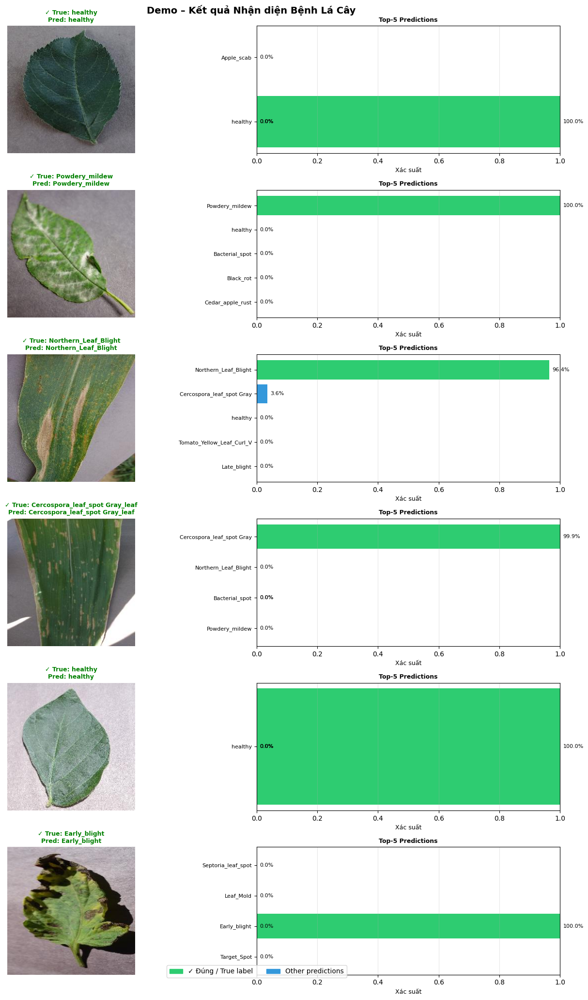

In [5]:
from PIL import Image
import matplotlib.patches as mpatches
import matplotlib.pyplot as plt
import numpy as np
import random
import os

def predict_leaf(image_path, model, class_names, img_size=224, top_k=5):
    """
    Nhận diện bệnh lá cây từ đường dẫn ảnh.
    Trả về top-k dự đoán với xác suất.
    """
    img = Image.open(image_path).convert('RGB')
    img_resized = img.resize((img_size, img_size))
    img_array  = np.array(img_resized)
    img_tensor = np.expand_dims(img_array, axis=0)

    preds = model.predict(img_tensor, verbose=0)[0]
    top_k_idx  = np.argsort(preds)[::-1][:top_k]
    top_k_pred = [(class_names[i], preds[i]) for i in top_k_idx]
    return img, top_k_pred


def demo_predictions(test_dir, class_names, model, n_samples=6):
    """Chạy demo trên n ảnh ngẫu nhiên từ test set."""
    all_test_imgs = []
    for cls in os.listdir(test_dir):
        cls_path = os.path.join(test_dir, cls)
        for f in os.listdir(cls_path):
            all_test_imgs.append((os.path.join(cls_path, f), cls))

    samples = random.sample(all_test_imgs, n_samples)

    fig, axes = plt.subplots(n_samples, 2, figsize=(14, n_samples * 3.5))
    if n_samples == 1:
        axes = [axes]

    for row, (img_path, true_cls) in enumerate(samples):
        img, preds = predict_leaf(img_path, model, class_names)
        ax_img, ax_bar = axes[row]

        # Hiển thị ảnh
        ax_img.imshow(img)
        true_short = true_cls.split('___')[1] if '___' in true_cls else true_cls
        pred_short = preds[0][0].split('___')[1] if '___' in preds[0][0] else preds[0][0]
        correct = (preds[0][0] == true_cls)
        color   = 'green' if correct else 'red'
        symbol  = '✓' if correct else '✗'
        ax_img.set_title(f"{symbol} True: {true_short[:30]}\nPred: {pred_short[:30]}",
                         fontsize=9, color=color, fontweight='bold')
        ax_img.axis('off')

        # Bar chart top-5
        names = [p[0].split('___')[1][:25] if '___' in p[0] else p[0][:25]
                 for p in preds]
        probs = [p[1] for p in preds]
        bar_colors = ['#2ecc71' if p[0] == true_cls else '#3498db' for p in preds]
        bars = ax_bar.barh(names[::-1], probs[::-1], color=bar_colors[::-1])
        ax_bar.set_xlim(0, 1)
        ax_bar.set_xlabel('Xác suất', fontsize=9)
        ax_bar.set_title('Top-5 Predictions', fontsize=9, fontweight='bold')
        for bar, prob in zip(bars, probs[::-1]):
            ax_bar.text(bar.get_width() + 0.01, bar.get_y() + bar.get_height()/2,
                       f'{prob:.1%}', va='center', fontsize=8)
        ax_bar.grid(axis='x', alpha=0.3)
        ax_bar.tick_params(axis='y', labelsize=8)

    patch_correct = mpatches.Patch(color='#2ecc71', label='✓ Đúng / True label')
    patch_other   = mpatches.Patch(color='#3498db', label='Other predictions')
    plt.legend(handles=[patch_correct, patch_other],
               loc='lower center', ncol=2,
               bbox_to_anchor=(0, -0.05), fontsize=10)

    plt.suptitle('Demo – Kết quả Nhận diện Bệnh Lá Cây', fontsize=14, fontweight='bold')
    plt.tight_layout()
    plt.savefig('demo_results.png', dpi=150, bbox_inches='tight')
    plt.show()


demo_predictions(test_dir, class_names, model, n_samples=6)


## 📷 14. Nhận diện ảnh của bạn (Upload ảnh lá cây bất kỳ)


Upload ảnh lá cây của bạn: 


Saving images.jpg to images.jpg

Loài cây    : Corn_(maize)
Chẩn đoán   : Cercospora_leaf_spot Gray_leaf_spot
Độ tin cậy  : 99.8%
Phát hiện bệnh – Nên tham khảo chuyên gia nông nghiệp.


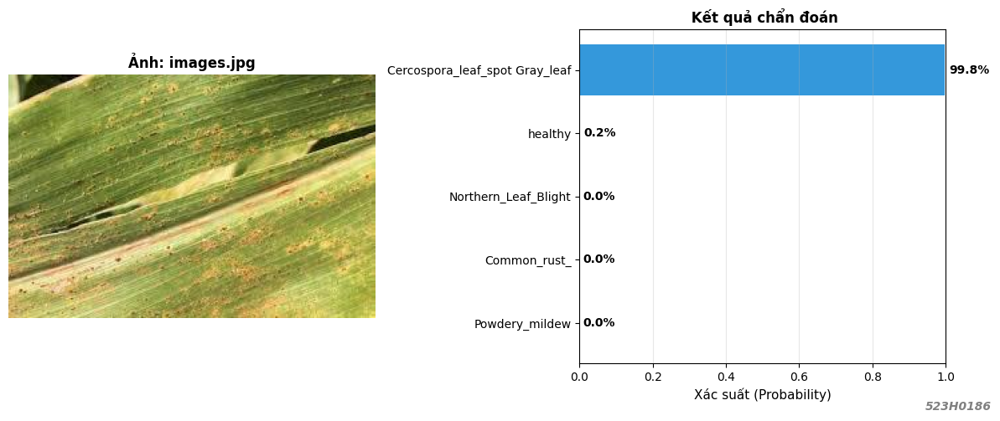


Bạn có muốn tải thêm ảnh khác không? (Nhập 'y' để tiếp tục / Nhấn Enter để thoát): y

Upload ảnh lá cây của bạn: 


Saving black-rot-of-grape-grape-1575457334.jpg to black-rot-of-grape-grape-1575457334.jpg

Loài cây    : Grape
Chẩn đoán   : Black_rot
Độ tin cậy  : 99.1%
Phát hiện bệnh – Nên tham khảo chuyên gia nông nghiệp.


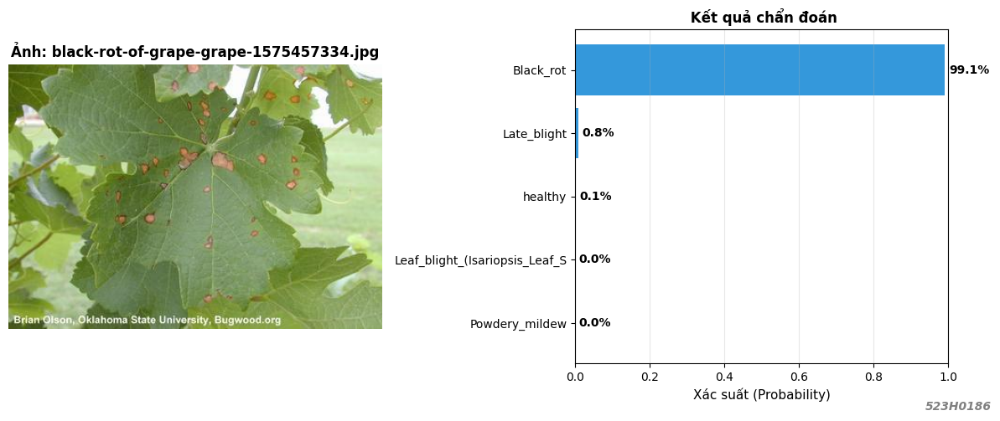


Bạn có muốn tải thêm ảnh khác không? (Nhập 'y' để tiếp tục / Nhấn Enter để thoát): y

Upload ảnh lá cây của bạn: 


Saving images (1).jpg to images (1).jpg

Loài cây    : Tomato
Chẩn đoán   : Late_blight
Độ tin cậy  : 100.0%
Phát hiện bệnh – Nên tham khảo chuyên gia nông nghiệp.


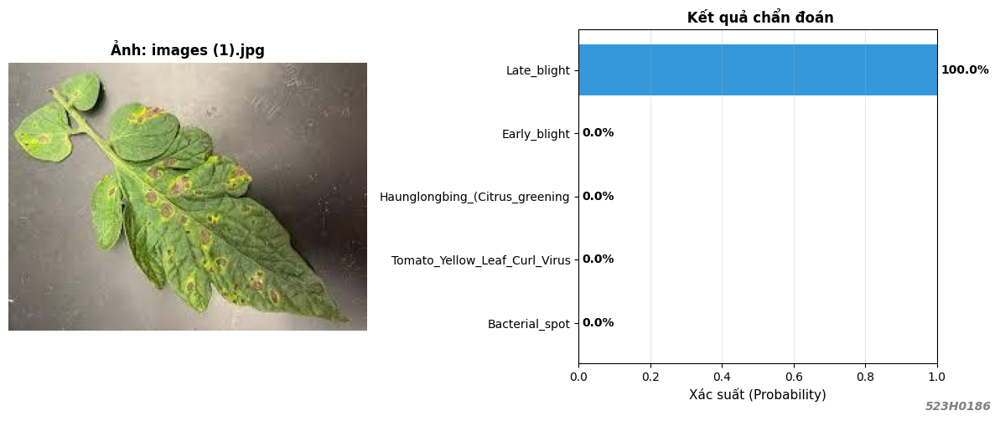


Bạn có muốn tải thêm ảnh khác không? (Nhập 'y' để tiếp tục / Nhấn Enter để thoát): 
Đã thoát vòng lặp test.


In [6]:
from google.colab import files
import io
import matplotlib.pyplot as plt
from PIL import Image

while True:
    print("\n" + "="*50)
    print("Upload ảnh lá cây của bạn: ")
    print("="*50)

    # 1. Mở hộp thoại tải file
    uploaded = files.upload()

    # 2. Xử lý trường hợp người dùng bấm Cancel (không tải file nào)
    if not uploaded:
        print("Đã thoát chương trình do không có file nào được tải lên!")
        break

    # 3. Xử lý ảnh và dự đoán
    for filename, content in uploaded.items():
        img_pil = Image.open(io.BytesIO(content)).convert('RGB')
        img_pil.save(f'/content/{filename}')

        img, preds = predict_leaf(f'/content/{filename}', model, class_names)

        fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5))

        ax1.imshow(img)
        ax1.axis('off')
        ax1.set_title(f'Ảnh: {filename}', fontweight='bold', fontsize=12)

        names = [p[0].split('___')[1][:30] if '___' in p[0] else p[0][:30]
                 for p in preds]
        probs = [p[1] for p in preds]
        bars = ax2.barh(names[::-1], probs[::-1], color='#3498db')
        ax2.set_xlabel('Xác suất (Probability)', fontsize=11)
        ax2.set_title(' Kết quả chẩn đoán', fontweight='bold', fontsize=12)
        ax2.set_xlim(0, 1)

        for bar, prob in zip(bars, probs[::-1]):
            ax2.text(bar.get_width()+0.01, bar.get_y()+bar.get_height()/2,
                     f'{prob:.1%}', va='center', fontweight='bold', fontsize=10)
        ax2.grid(axis='x', alpha=0.3)

        plant, disease = (preds[0][0].split('___') + ['Unknown'])[:2]
        confidence = preds[0][1]

        print(f"\n{'='*50}")
        print(f"Loài cây    : {plant}")
        print(f"Chẩn đoán   : {disease}")
        print(f"Độ tin cậy  : {confidence:.1%}")
        print(f"{'='*50}")

        if 'healthy' in disease.lower():
            print("Cây khỏe mạnh! Không phát hiện bệnh.")
        else:
            print(f"Phát hiện bệnh – Nên tham khảo chuyên gia nông nghiệp.")

        # Thêm Watermark vào góc ảnh xuất ra
        plt.figtext(0.99, 0.01, '523H0186', horizontalalignment='right',
                    fontsize=10, color='gray', style='italic', fontweight='bold')

        plt.tight_layout()
        plt.savefig(f'result_{filename}', dpi=150, bbox_inches='tight')
        plt.show()

    # 4. Tùy chọn tiếp tục hay thoát
    tiep_tuc = input("\nBạn có muốn tải thêm ảnh khác không? (Nhập 'y' để tiếp tục / Nhấn Enter để thoát): ")

    if tiep_tuc.lower() not in ['y', 'yes']:
        print("Đã thoát vòng lặp test.")
        break

## 🔥 15. Grad-CAM – Giải thích mô hình (Explainability)

Grad-CAM cho thấy mô hình **chú ý vào vùng nào** của lá cây khi đưa ra quyết định,
giúp xác nhận model học đúng pattern bệnh (không phải background).


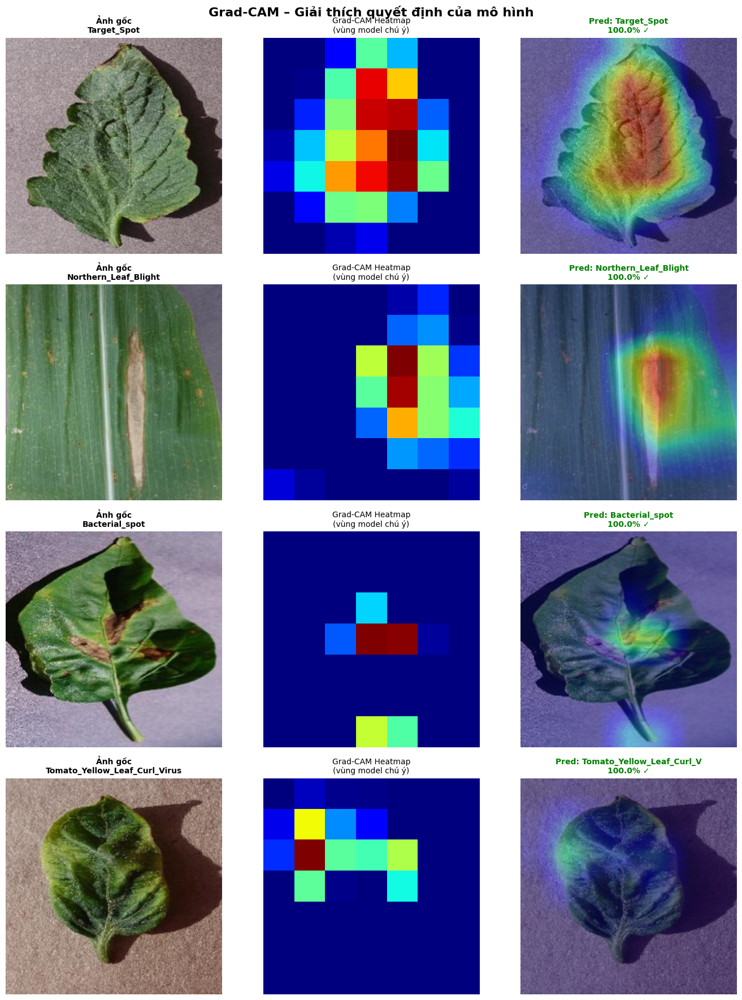

In [ ]:
import tensorflow as tf
import numpy as np
import os
import random
from PIL import Image
import matplotlib.pyplot as plt

def make_gradcam_heatmap(img_array, model, inner_model_name='efficientnetb0', last_conv_layer_name='top_conv'):
    """Tạo Grad-CAM heatmap hỗ trợ mô hình lồng (Transfer Learning)."""

    # 1. Trích xuất cái "ruột" EfficientNet ra
    inner_model = model.get_layer(inner_model_name)

    # 2. Tạo mô hình Khúc 1 (Backbone): Input -> [Layer Conv cuối, Output của EfficientNet]
    inner_grad_model = tf.keras.Model(
        inputs=[inner_model.inputs],
        outputs=[inner_model.get_layer(last_conv_layer_name).output, inner_model.output]
    )

    # 3. Tạo mô hình Khúc 2 (Classifier Head): Output của EfficientNet -> Dự đoán cuối cùng
    # Bỏ qua lớp Input (index 0) và lớp EfficientNet (index 1), lấy từ index 2 trở đi
    classifier_input = tf.keras.Input(shape=inner_model.output.shape[1:])
    x = classifier_input
    for layer in model.layers[2:]:
        x = layer(x)
    classifier_model = tf.keras.Model(inputs=classifier_input, outputs=x)

    # 4. Theo dõi và tính toán Gradient
    with tf.GradientTape() as tape:
        # Bước A: Cho ảnh qua khúc 1
        last_conv_output, inner_output = inner_grad_model(img_array, training=False)

        # BẮT BUỘC: Yêu cầu GradientTape theo dõi cái feature map này
        tape.watch(last_conv_output)

        # Bước B: Cho kết quả qua khúc 2 để lấy dự đoán bệnh
        preds = classifier_model(inner_output, training=False)

        # Lấy xác suất của bệnh có khả năng cao nhất
        pred_index = tf.argmax(preds[0])
        class_channel = preds[:, pred_index]

    # 5. Tính đạo hàm của xác suất bệnh đó theo cái feature map
    grads = tape.gradient(class_channel, last_conv_output)

    # 6. Vẽ Heatmap
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))
    heatmap = last_conv_output[0] @ pooled_grads[..., tf.newaxis]
    heatmap = tf.squeeze(heatmap)

    # Chuẩn hóa giá trị heatmap về khoảng [0, 1]
    heatmap = tf.maximum(heatmap, 0) / (tf.math.reduce_max(heatmap) + 1e-8)
    return heatmap.numpy()


def overlay_gradcam(img_pil, heatmap, alpha=0.4):
    heatmap_resized = np.array(Image.fromarray(
        np.uint8(255 * heatmap)).resize(img_pil.size, Image.BILINEAR))
    heatmap_color = plt.cm.jet(heatmap_resized / 255.)[:, :, :3]

    # Bước này chia 255 là đúng vì chỉ dùng để vẽ hình (Matplotlib)
    img_array = np.array(img_pil) / 255.
    superimposed = img_array * (1 - alpha) + heatmap_color * alpha
    return np.clip(superimposed, 0, 1)


# Demo Grad-CAM trên 4 ảnh test ngẫu nhiên
all_imgs = []
for cls in os.listdir(test_dir):
    for f in os.listdir(os.path.join(test_dir, cls)):
        all_imgs.append((os.path.join(test_dir, cls, f), cls))

sample_imgs = random.sample(all_imgs, 4)
fig, axes = plt.subplots(4, 3, figsize=(14, 18))

for row, (img_path, true_cls) in enumerate(sample_imgs):
    img_pil = Image.open(img_path).convert('RGB').resize((IMG_SIZE, IMG_SIZE))

    # 🌟 ĐÃ SỬA: Xóa bỏ / 255. để giữ nguyên pixel [0-255] nạp vào model
    img_arr = np.array(img_pil)
    img_tensor = np.expand_dims(img_arr, 0).astype(np.float32)

    preds = model.predict(img_tensor, verbose=0)[0]
    pred_idx = np.argmax(preds)
    pred_cls = class_names[pred_idx]
    pred_disease = pred_cls.split('___')[1] if '___' in pred_cls else pred_cls
    true_disease = true_cls.split('___')[1] if '___' in true_cls else true_cls

    heatmap = make_gradcam_heatmap(img_tensor, model)
    cam_img = overlay_gradcam(img_pil, heatmap)

    # Original (Chia 255 ở đây chỉ để Matplotlib hiển thị ảnh màu cho chuẩn)
    axes[row, 0].imshow(img_arr / 255.0)
    axes[row, 0].set_title(f'Ảnh gốc\n{true_disease[:30]}', fontsize=10, fontweight='bold')
    axes[row, 0].axis('off')

    # Heatmap
    axes[row, 1].imshow(heatmap, cmap='jet')
    axes[row, 1].set_title('Grad-CAM Heatmap\n(vùng model chú ý)', fontsize=10)
    axes[row, 1].axis('off')

    # Overlay
    correct = (pred_cls == true_cls)
    color = 'green' if correct else 'red'
    axes[row, 2].imshow(cam_img)
    axes[row, 2].set_title(f'Pred: {pred_disease[:25]}\n{preds[pred_idx]:.1%} {"✓" if correct else "✗"}',
                            fontsize=10, color=color, fontweight='bold')
    axes[row, 2].axis('off')

plt.suptitle('Grad-CAM – Giải thích quyết định của mô hình', fontsize=16, fontweight='bold')
plt.tight_layout()
plt.savefig('gradcam.png', dpi=150, bbox_inches='tight')
plt.show()

## 💾 16. Lưu Model & Export

In [ ]:
from google.colab import files

# Lưu checkpoint tốt nhất
model.save('/content/plant_disease_efficientnet.keras')
print("Đã lưu model: plant_disease_efficientnet.keras")

# Lưu class names
import json
with open('/content/class_names.json', 'w') as f:
    json.dump(class_names, f, indent=2)
print("Đã lưu class names: class_names.json")

# Tóm tắt kết quả
print(f"""
╔══════════════════════════════════════════════════════╗
║           KẾT QUẢ HUẤN LUYỆN – TÓM TẮT             ║
╠══════════════════════════════════════════════════════╣
║  Mô hình    : EfficientNetB0 (Transfer Learning)    ║
║  Dataset    : PlantVillage – 38 lớp                 ║
║  Test Acc   : {test_acc:.4f} ({test_acc*100:.2f}%)               ║
║  Top-5 Acc  : {test_top5:.4f} ({test_top5*100:.2f}%)               ║
║  Checkpoint : best_model.keras                         ║
╚══════════════════════════════════════════════════════╝
""")

# Download model về máy
print("Tải model về máy local...")
files.download('/content/best_model.keras')
files.download('/content/class_names.json')


Đã lưu model: plant_disease_efficientnet.keras
Đã lưu class names: class_names.json

╔══════════════════════════════════════════════════════╗
║           KẾT QUẢ HUẤN LUYỆN – TÓM TẮT             ║
╠══════════════════════════════════════════════════════╣
║  Mô hình    : EfficientNetB0 (Transfer Learning)    ║
║  Dataset    : PlantVillage – 38 lớp                 ║
║  Test Acc   : 0.9884 (98.84%)               ║
║  Top-5 Acc  : 1.0000 (100.00%)               ║
║  Checkpoint : best_model.keras                         ║
╚══════════════════════════════════════════════════════╝

Tải model về máy local...


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

## 📝 17. Phân tích & Kết luận

### ✅ Tại sao giải pháp này hoạt động tốt?

#### 1. Transfer Learning từ ImageNet
EfficientNetB0 đã học được các feature cơ bản từ 1.2 triệu ảnh:
- **Layer đầu**: Phát hiện cạnh, texture, màu sắc
- **Layer giữa**: Hình dạng, pattern phức tạp  
- **Layer cuối**: Đặc trưng semantic của vật thể

Những feature này rất hữu ích cho bài toán nhận diện bệnh lá (color spots, texture thay đổi, vết nám).

#### 2. Two-Phase Training Strategy
- **Phase 1** (frozen backbone): Train nhanh classification head, tránh phá vỡ pretrained features
- **Phase 2** (fine-tuning): Điều chỉnh backbone để phù hợp domain lá cây với LR nhỏ

#### 3. Data Augmentation
Augmentation giúp model robust với:
- Góc chụp khác nhau (rotation, flip)
- Điều kiện ánh sáng (brightness)
- Zoom in/out khi chụp

#### 4. Grad-CAM Explainability
Chứng minh model học đúng vùng bệnh trên lá, không phải background — tăng độ tin cậy.

---

### 🚀 Hướng phát triển tiếp theo

| Hướng | Mô tả |
|---|---|
| 📱 Mobile Deploy | Chuyển sang TFLite để chạy trên điện thoại nông dân |
| 🌏 Dataset mở rộng | Thu thập thêm ảnh ngoài đồng ruộng VN (điều kiện thực tế hơn lab) |
| 🔍 Object Detection | YOLOv8 để detect vùng bệnh trên toàn bộ cây |
| 🤖 Few-Shot Learning | Nhận diện bệnh mới chưa có trong training set |
| 📡 Edge AI | Deploy lên Raspberry Pi gắn trên drone bay qua ruộng |

---

### 📚 Tài liệu tham khảo

1. Hughes, D.P. & Salathé, M. (2015). *An open access repository of images on plant health.* arXiv:1511.08060  
2. Tan, M. & Le, Q.V. (2019). *EfficientNet: Rethinking Model Scaling.* ICML 2019  
3. Selvaraju et al. (2017). *Grad-CAM: Visual Explanations from Deep Networks.* ICCV 2017  
4. PlantVillage Dataset: https://www.kaggle.com/datasets/abdallahalidev/plantvillage-dataset


## ☁️ [SAVE] Lưu tất cả lên Google Drive

> Chạy cell này sau khi training hoàn thành để bảo toàn toàn bộ kết quả,  
> tránh mất dữ liệu khi Colab reset.


In [ ]:
# ============================================================
#  LƯU TẤT CẢ LÊN GOOGLE DRIVE
#  Chạy cell này sau khi train xong
# ============================================================
import os, shutil, json, time
from google.colab import drive

drive.mount('/content/drive')

DRIVE_DIR = '/content/drive/MyDrive/PlantDisease_Checkpoint'
os.makedirs(DRIVE_DIR, exist_ok=True)
print(f" Lưu vào: {DRIVE_DIR}\n")

saved, failed = [], []

def save_file(src, dest_dir, label):
    if os.path.exists(src):
        shutil.copy2(src, dest_dir)
        size = os.path.getsize(src) / 1024
        unit = 'KB' if size < 1024 else 'MB'
        size = size if size < 1024 else size / 1024
        print(f"   {label:<30s} ({size:.1f} {unit})")
        saved.append(label)
    else:
        print(f"    {label:<30s} (không tìm thấy, bỏ qua)")
        failed.append(label)

# ── 1. Model checkpoint ──────────────────────────────────────
print(" Model:")
save_file('/content/best_model.keras',        DRIVE_DIR, 'best_model.keras')
save_file('/content/checkpoint_phase1.keras', DRIVE_DIR, 'checkpoint_phase1.keras')

# ── 2. Class names ───────────────────────────────────────────
print("\n Metadata:")
save_file('/content/class_names.json', DRIVE_DIR, 'class_names.json')

# ── 3. Nén split dataset ─────────────────────────────────────
print("\n Dataset (split train/val/test):")
split_zip = f'{DRIVE_DIR}/split_data.zip'
if os.path.exists('/content/split'):
    print("    Đang nén /content/split → split_data.zip ...")
    t0 = time.time()
    shutil.make_archive(split_zip.replace('.zip',''), 'zip', '/content/split')
    size_mb = os.path.getsize(split_zip) / (1024**2)
    elapsed = time.time() - t0
    print(f"   {'split_data.zip':<30s} ({size_mb:.1f} MB, {elapsed:.0f}s)")
    saved.append('split_data.zip')
else:
    print("    /content/split không tồn tại, bỏ qua")
    failed.append('split_data.zip')

# ── 4. Biểu đồ / hình ảnh kết quả ──────────────────────────
print("\n  Biểu đồ & kết quả:")
images = [
    ('eda_distribution.png',  'EDA – Phân phối dữ liệu'),
    ('eda_samples.png',       'EDA – Mẫu ảnh'),
    ('augmentation.png',      'Data Augmentation'),
    ('training_curves.png',   'Training Curves'),
    ('confusion_matrix.png',  'Confusion Matrix'),
    ('demo_results.png',      'Demo Results'),
    ('gradcam.png',           'Grad-CAM'),
]
for fname, label in images:
    save_file(f'/content/{fname}', DRIVE_DIR, fname)

# ── Tóm tắt ─────────────────────────────────────────────────
total_drive = sum(
    os.path.getsize(os.path.join(DRIVE_DIR, f))
    for f in os.listdir(DRIVE_DIR)
    if os.path.isfile(os.path.join(DRIVE_DIR, f))
) / (1024**2)

print(f"""
╔══════════════════════════════════════════════════════════╗
║              ☁️  LƯU DRIVE HOÀN TẤT                     ║
╠══════════════════════════════════════════════════════════╣
║   Đã lưu  : {len(saved):>2d} file(s)                          ║
║   Bỏ qua : {len(failed):>2d} file(s)                          ║
║   Thư mục : PlantDisease_Checkpoint                   ║
║   Tổng kích thước Drive: {total_drive:>6.1f} MB                ║
╚══════════════════════════════════════════════════════════╝

📌 Lần sau Colab reset:
   → Chạy cell [LOAD] ở đầu notebook để khôi phục toàn bộ
""")


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
 Lưu vào: /content/drive/MyDrive/PlantDisease_Checkpoint

 Model:
   best_model.keras               (35.8 MB)
   checkpoint_phase1.keras        (20.2 MB)

 Metadata:
   class_names.json               (1.1 KB)

 Dataset (split train/val/test):
    Đang nén /content/split → split_data.zip ...
   split_data.zip                 (814.2 MB, 56s)

  Biểu đồ & kết quả:
   eda_distribution.png           (187.7 KB)
   eda_samples.png                (4.2 MB)
   augmentation.png               (2.3 MB)
   training_curves.png            (153.8 KB)
   confusion_matrix.png           (243.6 KB)
   demo_results.png               (1.6 MB)
   gradcam.png                    (3.2 MB)

╔══════════════════════════════════════════════════════════╗
║              ☁️  LƯU DRIVE HOÀN TẤT                     ║
╠══════════════════════════════════════════════════════════╣
║   Đã lưu  : 11 

## 🌐 18. Web Demo – Gradio Interface

Tạo giao diện web tương tác để demo mô hình nhận diện bệnh lá cây.
- Upload ảnh lá cây → Mô hình dự đoán bệnh + xác suất
- Hiển thị **Top-5 dự đoán** dạng biểu đồ
- Tích hợp **Grad-CAM** để giải thích vùng mô hình chú ý
- Chạy trực tiếp trên Colab với public link


In [3]:
# ============================================================
#  WEB DEMO – GRADIO INTERFACE
#  Nhận diện bệnh lá cây với EfficientNetB0
# ============================================================

# ── Cài đặt Gradio ──────────────────────────────────────────
!pip install -q gradio

import gradio as gr
import numpy as np
import tensorflow as tf
import json, os
import matplotlib
matplotlib.use('Agg')
import matplotlib.pyplot as plt
from PIL import Image

# ── Load model & class names ─────────────────────────────────
# Ưu tiên dùng best_model.keras nếu có, fallback về checkpoint Drive
MODEL_PATHS = [
    '/content/best_model.keras',
    '/content/plant_disease_efficientnet.keras',
    '/content/drive/MyDrive/PlantDisease_Checkpoint/best_model.keras',
]
CLASS_PATHS = [
    '/content/class_names.json',
    '/content/drive/MyDrive/PlantDisease_Checkpoint/class_names.json',
]

model_path = next((p for p in MODEL_PATHS if os.path.exists(p)), None)
class_path = next((p for p in CLASS_PATHS if os.path.exists(p)), None)

assert model_path, "Không tìm thấy model! Hãy train hoặc load từ Drive trước."
assert class_path, "Không tìm thấy class_names.json!"

print(f"Đang load model: {model_path}")
_model = tf.keras.models.load_model(model_path)
with open(class_path) as f:
    _class_names = json.load(f)
IMG_SIZE = 224
print(f"Model sẵn sàng – {len(_class_names)} lớp")

# ── Hàm Grad-CAM ─────────────────────────────────────────────
def compute_gradcam(img_tensor, model):
    try:
        inner = model.get_layer('efficientnetb0')
        grad_model = tf.keras.Model(
            inputs=[inner.inputs],
            outputs=[inner.get_layer('top_conv').output, inner.output]
        )
        classifier_input = tf.keras.Input(shape=inner.output.shape[1:])
        x = classifier_input
        for layer in model.layers[2:]:
            x = layer(x)
        clf = tf.keras.Model(inputs=classifier_input, outputs=x)

        with tf.GradientTape() as tape:
            conv_out, inner_out = grad_model(img_tensor, training=False)
            tape.watch(conv_out)
            preds = clf(inner_out, training=False)
            class_channel = preds[:, tf.argmax(preds[0])]
        grads = tape.gradient(class_channel, conv_out)
        pooled = tf.reduce_mean(grads, axis=(0, 1, 2))
        heatmap = conv_out[0] @ pooled[..., tf.newaxis]
        heatmap = tf.squeeze(heatmap)
        heatmap = tf.maximum(heatmap, 0) / (tf.math.reduce_max(heatmap) + 1e-8)
        return heatmap.numpy()
    except Exception:
        return None

# ── Hàm dự đoán chính ────────────────────────────────────────
def predict_disease(image: Image.Image):
    """Nhận PIL Image → trả về (label_str, confidence_chart, gradcam_img)"""
    # Tiền xử lý
    img_resized = image.convert('RGB').resize((IMG_SIZE, IMG_SIZE))
    img_arr = np.array(img_resized, dtype=np.float32)   # [0-255], không normalize
    img_tensor = np.expand_dims(img_arr, 0)

    # Dự đoán
    preds = _model.predict(img_tensor, verbose=0)[0]
    top5_idx = np.argsort(preds)[::-1][:5]

    # Kết quả top-1
    top1_idx   = top5_idx[0]
    top1_name  = _class_names[top1_idx]
    top1_conf  = preds[top1_idx]
    plant, disease = (top1_name.split('___') + [''])[:2]
    is_healthy = 'healthy' in disease.lower()
    status_icon = '✅' if is_healthy else '🔴'
    result_text = (
        f"{status_icon} **Cây:** {plant.replace('_', ' ')}\n"
        f"{'✅ **Trạng thái:** Khỏe mạnh' if is_healthy else f'🔴 **Bệnh:** {disease.replace("_", " ")}'}\n"
        f"📊 **Độ tin cậy:** {top1_conf:.1%}"
    )

    # Biểu đồ Top-5
    fig, ax = plt.subplots(figsize=(7, 3))
    labels = []
    for i in top5_idx:
        n = _class_names[i]
        p, d = (n.split('___') + [''])[:2]
        labels.append(f"{p.replace('_',' ')} – {d.replace('_',' ')[:25]}")
    scores = [preds[i] for i in top5_idx]
    colors_bar = ['#2ecc71' if 'healthy' in lb.lower() else '#e74c3c' for lb in labels]
    colors_bar[0] = '#27ae60' if 'healthy' in labels[0].lower() else '#c0392b'
    bars = ax.barh(labels[::-1], scores[::-1], color=colors_bar[::-1], edgecolor='white', height=0.6)
    ax.set_xlim(0, 1)
    ax.set_xlabel('Xác suất', fontsize=10)
    ax.set_title('🔬 Top-5 Dự đoán', fontsize=12, fontweight='bold')
    for bar, score in zip(bars, scores[::-1]):
        ax.text(bar.get_width() + 0.01, bar.get_y() + bar.get_height()/2,
                f'{score:.1%}', va='center', fontsize=9)
    plt.tight_layout()

    # Grad-CAM overlay
    heatmap = compute_gradcam(img_tensor, _model)
    if heatmap is not None:
        hmap_resized = np.array(
            Image.fromarray(np.uint8(255 * heatmap)).resize(img_resized.size, Image.BILINEAR)
        )
        hmap_color = plt.cm.jet(hmap_resized / 255.)[:, :, :3]
        overlay = np.clip(np.array(img_resized) / 255. * 0.6 + hmap_color * 0.4, 0, 1)
        gradcam_img = Image.fromarray(np.uint8(overlay * 255))
    else:
        gradcam_img = img_resized

    plt.close('all')
    return result_text, fig, gradcam_img

# ── Ảnh mẫu (lấy từ test set nếu có) ────────────────────────
sample_imgs = []
if os.path.exists('/content/split/test'):
    import random
    for cls in random.sample(os.listdir('/content/split/test'), min(3, len(os.listdir('/content/split/test')))):
        cls_dir = os.path.join('/content/split/test', cls)
        files_in = os.listdir(cls_dir)
        if files_in:
            sample_imgs.append(os.path.join(cls_dir, random.choice(files_in)))

# ── Giao diện Gradio ─────────────────────────────────────────
with gr.Blocks(
    title="🌿 Plant Disease Detector",
    theme=gr.themes.Soft(primary_hue='green'),
    css=".gr-button-primary { background: #27ae60 !important; }"
) as demo:

    gr.Markdown("""
    # 🌿 Plant Disease Detector
    ### Nhận diện bệnh lá cây bằng EfficientNetB0 – PlantVillage (38 lớp)
    Upload ảnh lá cây và nhận kết quả chẩn đoán ngay lập tức!
    """)

    with gr.Row():
        with gr.Column(scale=1):
            inp_img = gr.Image(type='pil', label='📷 Ảnh lá cây (kéo thả hoặc click)', height=300)
            btn = gr.Button('🔍 Phân tích bệnh', variant='primary', size='lg')
            if sample_imgs:
                gr.Examples(examples=sample_imgs, inputs=inp_img, label='📁 Ảnh mẫu từ test set')

        with gr.Column(scale=2):
            out_result  = gr.Markdown(label='Kết quả chẩn đoán')
            out_chart   = gr.Plot(label='📊 Top-5 xác suất')
            out_gradcam = gr.Image(type='pil', label='🔥 Grad-CAM – Vùng mô hình chú ý', height=250)

    btn.click(
        fn=predict_disease,
        inputs=[inp_img],
        outputs=[out_result, out_chart, out_gradcam]
    )

    gr.Markdown("""
    ---
    **Mô hình:** EfficientNetB0 (Transfer Learning) | **Dataset:** PlantVillage – 54.306 ảnh | **Lớp:** 38
    """)

print("🚀 Đang khởi chạy web demo...")
demo.launch(share=True, debug=False)


Đang load model: /content/drive/MyDrive/PlantDisease_Checkpoint/best_model.keras
Model sẵn sàng – 38 lớp


/tmp/ipykernel_823/521436990.py:141: DeprecationWarning: The 'theme' parameter in the Blocks constructor will be removed in Gradio 6.0. You will need to pass 'theme' to Blocks.launch() instead.
  with gr.Blocks(
/tmp/ipykernel_823/521436990.py:141: DeprecationWarning: The 'css' parameter in the Blocks constructor will be removed in Gradio 6.0. You will need to pass 'css' to Blocks.launch() instead.
  with gr.Blocks(


🚀 Đang khởi chạy web demo...
Colab notebook detected. To show errors in colab notebook, set debug=True in launch()
* Running on public URL: https://84e6a5242e8422129b.gradio.live

This share link expires in 1 week. For free permanent hosting and GPU upgrades, run `gradio deploy` from the terminal in the working directory to deploy to Hugging Face Spaces (https://huggingface.co/spaces)


## Bảng Dịch Thuật – 38 Nhãn Bệnh Lá Cây (Tiếng Việt)

> Tham khảo khi đọc kết quả dự đoán từ mô hình.

| # | Nhãn gốc (class name) | 🌿 Cây | 🦠 Bệnh / Trạng thái | Ghi chú |
|---|---|---|---|---|
| 1 | Apple___Apple_scab | 🍎 Táo | Bệnh ghẻ táo (Apple Scab) | Nấm *Venturia inaequalis*, tạo vết đen trên lá |
| 2 | Apple___Black_rot | 🍎 Táo | Thối đen (Black Rot) | Nấm *Botryosphaeria obtusa*, vết nâu đen hình tròn |
| 3 | Apple___Cedar_apple_rust | 🍎 Táo | Gỉ sắt táo-tùng (Cedar Apple Rust) | Nấm *Gymnosporangium*, đốm cam/vàng trên lá |
| 4 | Apple___healthy | 🍎 Táo | ✅ Khỏe mạnh | — |
| 5 | Blueberry___healthy | 🫐 Việt quất | ✅ Khỏe mạnh | — |
| 6 | Cherry_(including_sour)___Powdery_mildew | 🍒 Anh đào | Phấn trắng (Powdery Mildew) | Nấm *Podosphaera*, lớp bột trắng trên lá |
| 7 | Cherry_(including_sour)___healthy | 🍒 Anh đào | ✅ Khỏe mạnh | — |
| 8 | Corn_(maize)___Cercospora_leaf_spot_Gray_leaf_spot | 🌽 Ngô | Đốm xám lá (Gray Leaf Spot) | Nấm *Cercospora zeae-maydis*, vệt xám dài trên lá |
| 9 | Corn_(maize)___Common_rust | 🌽 Ngô | Gỉ sắt phổ biến (Common Rust) | Nấm *Puccinia sorghi*, mụn nâu đỏ hai mặt lá |
| 10 | Corn_(maize)___Northern_Leaf_Blight | 🌽 Ngô | Cháy lá phía bắc (Northern Leaf Blight) | Nấm *Exserohilum turcicum*, vệt nâu xám hình thoi |
| 11 | Corn_(maize)___healthy | 🌽 Ngô | ✅ Khỏe mạnh | — |
| 12 | Grape___Black_rot | 🍇 Nho | Thối đen (Black Rot) | Nấm *Guignardia bidwellii*, đốm nâu viền đen |
| 13 | Grape___Esca_(Black_Measles) | 🍇 Nho | Bệnh Esca / Đốm đen (Black Measles) | Phức hợp nấm, vệt nâu xen kẽ trên lá |
| 14 | Grape___Leaf_blight_(Isariopsis_Leaf_Spot) | 🍇 Nho | Cháy lá / Đốm Isariopsis | Nấm *Pseudocercospora*, mảng nâu đỏ |
| 15 | Grape___healthy | 🍇 Nho | ✅ Khỏe mạnh | — |
| 16 | Orange___Haunglongbing_(Citrus_greening) | 🍊 Cam | Bệnh vàng lá greening (HLB) | Vi khuẩn *Candidatus Liberibacter*, lá vàng loang lổ |
| 17 | Peach___Bacterial_spot | 🍑 Đào | Đốm vi khuẩn (Bacterial Spot) | Vi khuẩn *Xanthomonas*, vết nâu thủng trên lá |
| 18 | Peach___healthy | 🍑 Đào | ✅ Khỏe mạnh | — |
| 19 | Pepper,_bell___Bacterial_spot | 🫑 Ớt chuông | Đốm vi khuẩn (Bacterial Spot) | Vi khuẩn *Xanthomonas*, vết nâu đen, mép vàng |
| 20 | Pepper,_bell___healthy | 🫑 Ớt chuông | ✅ Khỏe mạnh | — |
| 21 | Potato___Early_blight | 🥔 Khoai tây | Mốc sương sớm (Early Blight) | Nấm *Alternaria solani*, đốm nâu vòng đồng tâm |
| 22 | Potato___Late_blight | 🥔 Khoai tây | Mốc sương muộn (Late Blight) | Nấm *Phytophthora infestans*, vết nâu thâm ướt |
| 23 | Potato___healthy | 🥔 Khoai tây | ✅ Khỏe mạnh | — |
| 24 | Raspberry___healthy | 🫐 Mâm xôi | ✅ Khỏe mạnh | — |
| 25 | Soybean___healthy | 🌱 Đậu tương | ✅ Khỏe mạnh | — |
| 26 | Squash___Powdery_mildew | 🎃 Bí ngô | Phấn trắng (Powdery Mildew) | Nấm *Podosphaera*, bột trắng mặt trên lá |
| 27 | Strawberry___Leaf_scorch | 🍓 Dâu tây | Cháy lá (Leaf Scorch) | Nấm *Diplocarpon earlianum*, đốm tím đỏ nhỏ |
| 28 | Strawberry___healthy | 🍓 Dâu tây | ✅ Khỏe mạnh | — |
| 29 | Tomato___Bacterial_spot | 🍅 Cà chua | Đốm vi khuẩn (Bacterial Spot) | Vi khuẩn *Xanthomonas*, vết nâu nhỏ, viền vàng |
| 30 | Tomato___Early_blight | 🍅 Cà chua | Mốc sương sớm (Early Blight) | Nấm *Alternaria solani*, đốm nâu vòng đồng tâm |
| 31 | Tomato___Late_blight | 🍅 Cà chua | Mốc sương muộn (Late Blight) | Nấm *Phytophthora infestans*, mảng nâu xanh ướt |
| 32 | Tomato___Leaf_Mold | 🍅 Cà chua | Mốc lá (Leaf Mold) | Nấm *Passalora fulva*, mặt dưới lá phủ lớp mốc vàng |
| 33 | Tomato___Septoria_leaf_spot | 🍅 Cà chua | Đốm Septoria (Septoria Leaf Spot) | Nấm *Septoria lycopersici*, chấm trắng viền nâu |
| 34 | Tomato___Spider_mites_Two-spotted_spider_mite | 🍅 Cà chua | Nhện đỏ hai chấm (Spider Mites) | Nhện *Tetranychus urticae*, lá vàng lốm đốm, tơ mỏng |
| 35 | Tomato___Target_Spot | 🍅 Cà chua | Đốm mục tiêu (Target Spot) | Nấm *Corynespora cassiicola*, vòng tròn đồng tâm nâu |
| 36 | Tomato___Tomato_Yellow_Leaf_Curl_Virus | 🍅 Cà chua | Virus xoăn vàng lá (TYLCV) | Virus do bọ phấn trắng truyền, lá vàng xoăn lại |
| 37 | Tomato___Tomato_mosaic_virus | 🍅 Cà chua | Virus khảm cà chua (ToMV) | Virus khảm, lá loang vàng xanh xen kẽ |
| 38 | Tomato___healthy | 🍅 Cà chua | ✅ Khỏe mạnh | — |

---

**Tổng kết theo loài cây:**

| Cây | Số nhãn | Gồm |
|---|---|---|
| 🍅 Cà chua | 10 | 9 bệnh + 1 khỏe mạnh |
| 🍎 Táo | 4 | 3 bệnh + 1 khỏe mạnh |
| 🍇 Nho | 4 | 3 bệnh + 1 khỏe mạnh |
| 🌽 Ngô | 4 | 3 bệnh + 1 khỏe mạnh |
| 🥔 Khoai tây | 3 | 2 bệnh + 1 khỏe mạnh |
| 🍒 Anh đào | 2 | 1 bệnh + 1 khỏe mạnh |
| 🍑 Đào | 2 | 1 bệnh + 1 khỏe mạnh |
| 🫑 Ớt chuông | 2 | 1 bệnh + 1 khỏe mạnh |
| 🍓 Dâu tây | 2 | 1 bệnh + 1 khỏe mạnh |
| 🍊 Cam | 1 | 1 bệnh |
| 🎃 Bí ngô | 1 | 1 bệnh |
| 🫐 Việt quất | 1 | 1 khỏe mạnh |
| 🫐 Mâm xôi | 1 | 1 khỏe mạnh |
| 🌱 Đậu tương | 1 | 1 khỏe mạnh |
| **Tổng** | **38** | **26 bệnh + 14 khỏe mạnh** |
